# VQE Basic Estimator

This notebook intends to give a **basic** introduction on the Variational Quantum Eigensolver routine. 

We will infer the **minimal eigenvalue** of the **Pauli-Z matrix by executing the VQE routine on a Quantum Simulator and a real Quantum Computer**

## Imports

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
from qiskit_aer import AerSimulator
from qiskit.circuit import Parameter
from qiskit.quantum_info import SparsePauliOp
from qiskit.quantum_info.operators import Operator
from qiskit_ibm_runtime import QiskitRuntimeService, Session, Options, Estimator
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit_algorithms.optimizers import SPSA
from qiskit import QuantumCircuit, QuantumRegister
from qiskit.visualization import visualize_transition

with open('../../api_key.txt', 'r') as file:
    token = file.read()
    
service = QiskitRuntimeService(channel='ibm_quantum',token=token)

In [2]:
import warnings
warnings.simplefilter(action='ignore')

Some helper functions for plotting.

Nothing fancy here :). 

In [3]:
def plot_expect_landscape(phases,result_landscape,params=None,energy_list=None):
    values = result_landscape[0].data.evs
    plt.plot(phases/np.pi, values, label=r'$E= \langle 0| R_y^{\dagger}(\theta) Z  R_y(\theta) |0 \rangle$')
    if params != None and energy_list != None:
        plt.plot(np.array(params)/np.pi,energy_list,'o',label='Optimizer')
    plt.title(r'Expectation value $<\psi(\theta)|Z|\psi(\theta)>$ with variation in $\theta$')
    ax = plt.gca()
    ax.grid(True)
    ax.xaxis.set_major_formatter(tck.FormatStrFormatter('%g $\pi$'))
    ax.xaxis.set_major_locator(tck.MultipleLocator(base=1/2))
    plt.xlabel(r'$\theta$')
    plt.ylabel(r'$<\psi(\theta)|Z|\psi(\theta)>$')
    plt.legend()
    plt.show()

def backend_information(backend):
    print('Configuration:')
    print('  Name: ', backend.configuration().backend_name)
    print('  Version: ', backend.configuration().backend_version)
    print('  N-Qubits: ', backend.configuration().n_qubits)
    print('  Basis Gates: ',backend.configuration().basis_gates)
    print('Status:')
    print('  Operational: ', backend.status().operational)
    print('  Pending jobs:', backend.status().pending_jobs)
    print('  Status message:', backend.status().status_msg)

## Defining the optimization problem

Lets define a simple toy problem: The Pauli-Z matrix.

In [4]:
# Define the Pauli Z operator "ops" using the SparsePauliOp class
# Print the operator.

# Your code goes here:
ops = SparsePauliOp(['Z'])

## Defining the ansatz

We choose a parameterized quantum circuit (Rotational-Y-Gate) as ansatz.

By varying the free parameter $\theta$ of this circuit we will derive ever closer approximations to the lowest eigenvalue of our problem.

(live coding)

In [5]:
# Define the ansatz: a function that creates a QC with a rot-y gate applied to the 1st qubit

# Your code goes here:
def roty(param):
    qc = QuantumCircuit(1)
    qc.ry(param,0)
    return qc

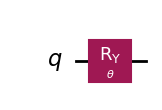

In [6]:
# Define a placeholder parameter "theta".
# Draw the ansath circuit using the placeholder parameter as input.

# Your code goes here:
theta = Parameter('$\\theta$')
qc_roty = roty(theta)
qc_roty.draw("mpl", style = "iqp")

Lets visualize how the qubit state changes for different values of the parameter $\theta$:

In [7]:
visualize_transition(qc_roty.assign_parameters({theta:2*np.pi}))

In [8]:
ansatz = qc_roty

## Visualize the problem landscape

We can get an intuition about our problem landscape by evaluating the expectation value of the problem, the Pauli Z matrix, with respect to our chosen ansatz, the rotational Y gate.

In [9]:
# Depict the problem landscape by evaluating the eigenvalues for several trial states
# Define the trial states by specifying theta from 0 to 4 pi..
phases = np.linspace(0, 4*np.pi, 100)
individual_phases = [[ph] for ph in phases]

To evaluate the expacation value for the chosen trial states, we first have to choose a backend on which the simulation is run. 

Let's first choose the a local simulator that mimics the a real hardware system. This is a **classical compute resources that simulate Quantum behaviour.** 

Note:
Let's not forget to transpile to the ISA of the underlying hardware.

In [10]:
real_backend = service.backend('ibm_brisbane')
sim_backend = AerSimulator.from_backend(real_backend)
sim_backend

AerSimulator('aer_simulator_from(ibm_brisbane)'
             noise_model=<NoiseModel on ['measure', 'reset', 'x', 'ecr', 'sx', 'id']>)

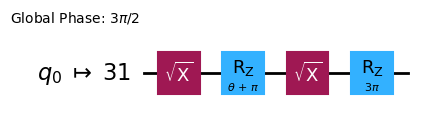

In [11]:
pm = generate_preset_pass_manager(backend=sim_backend, optimization_level=3)
isa_ansatz = pm.run(ansatz)
isa_ansatz.draw("mpl", idle_wires=False)

In [12]:
isa_ops = ops.apply_layout(layout=isa_ansatz.layout)
isa_ops

SparsePauliOp(['IIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIZIIIIIIIIIIIIIIIIIIIIIIIIIIIIIII'],
              coeffs=[1.+0.j])

Lets start the simulation: 

- With the 'Session' context manager we can establish a connection to the backend (and close this connection immediately after the computation is over)
- We can evaluate the eigenvalue of an observable w.r.t to a trial state, using the Qiskit-Runtime-Primitive "Estimator".

In [17]:
# Use the session context manager to evaluate the trail wave functions, on our observable.

# Your code goes here: 
pub = (isa_ansatz, isa_ops, individual_phases)
with Session(backend=sim_backend) as session:
    estimator = Estimator(mode=session)
    result_landscape = estimator.run([pub]).result()
    
print(min(result_landscape[0].data.evs))

-0.9892578125


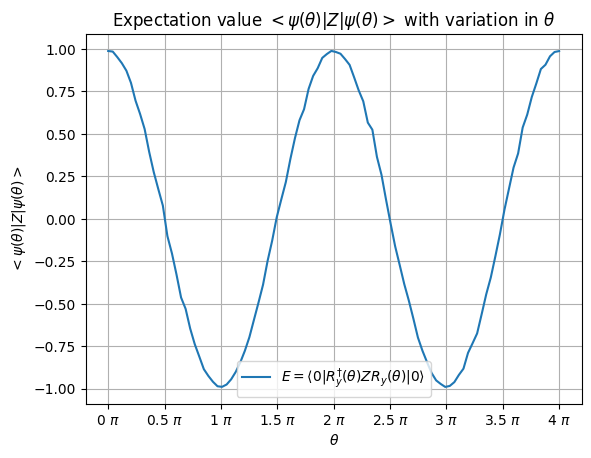

In [18]:
plot_expect_landscape(phases,result_landscape)

Some insights from this graph: 

- The minimal eigenvalue of the Pauli Z matrix is -1. 
- The problem is ($2 \pi$) periodic.

## Solve the optimization problem with a Quantum simulator

Now its time for VQE: 

We will now use the VQE-routine to infer the minimal eigenvalue.

Remember: 

- Our objective is to find the minimal eigenvalue of the Pauli-Z matrix.
- A classical optimization algorithm will evaluate the slack parameters $\theta$ of our ansatz.

In [19]:
# Define the VQE routine to infer the minimal expectation value
def custom_vqe_estimator(estimator,ansatz,ops,optimizer=None,initial_point=None):
    energy_list = []
    param_list = []
    
    #Objective function is the expectation value E = <psi(theta)|OPS|psi(theta)>
    def objective_function(params):
        # The cost is the expectation value of the observable

        # Your code goes here:
        # Use the pub pattern and extract the result of the expectation value as `cost`
        pub = (ansatz,ops,params)
        result = estimator.run([pub]).result()
        cost = result[0].data.evs

        
        
        print(f'Backend: {estimator.mode.backend()} - Cost: {cost}')
        return cost
    
    # Call back function
    def callback(x,fx,ax,tx,nx):
    # Callback function to get a view on internal states and statistics of the optimizer for visualization
        energy_list.append(ax)
        param_list.append(fx)
            
    if initial_point is None:
        initial_point = np.random.random(ansatz.num_parameters)

    # Define optimizer and pass callback function
    if optimizer == None:
        optimizer = SPSA(maxiter=10, callback=callback)
        
    # Define minimize function
    
    # Your code goes here:
    # The optimizer should minimize the objective_function fun starting from initial_point x0
    result = optimizer.minimize(fun=objective_function,x0=initial_point)

    return  param_list, energy_list, result           

In [51]:
# Evaluate minimal expectation value with the VQE routine
# Check job progress on quantum-computing.ibm.com -> jobs.

# Your code goes here:
with Session(service=service, backend=sim_backend) as session:
    estimator = Estimator(mode=session)
    param_list_sim, energy_list_sim, result = custom_vqe_estimator(estimator=estimator,
                                                               ansatz=isa_ansatz, 
                                                               ops=isa_ops,)
params_sim = [p[0] for p in param_list_sim]

Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.384765625
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.71533203125
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.390625
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.71484375
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.740234375
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.39013671875
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.71044921875
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.3974609375
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.40234375
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.7177734375
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.40966796875
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.72998046875
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.416015625
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.7109375
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.75390625
Backend: aer_simulator_from(ibm_brisbane) - Cost: 0.390625
Backend

Let's visualize the path our optimizer was taking.

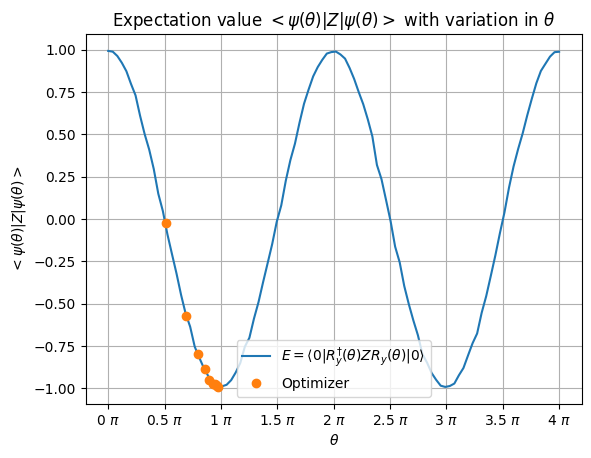

In [52]:
plot_expect_landscape(phases,result_landscape,params_sim,energy_list_sim)